In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from solvers.solver_4x4 import solve_4x4

def load_pieces(image_path, grid_size=4):
    img = cv2.imread(str(image_path))
    h, w = img.shape[:2]
    ph, pw = h // grid_size, w // grid_size
    artifacts = {}
    for idx in range(grid_size * grid_size):
        r, c = idx // grid_size, idx % grid_size
        piece = img[r*ph:(r+1)*ph, c*pw:(c+1)*pw].copy()
        gray = cv2.cvtColor(piece, cv2.COLOR_BGR2GRAY)
        edges = cv2.Canny(gray, 50, 150)
        blur = cv2.GaussianBlur(gray, (15, 15), 0)
        artifacts[idx] = {
            'rgb': cv2.cvtColor(piece, cv2.COLOR_BGR2RGB),
            'gray': gray,
            'edges': edges,
            'blur': blur
        }
    return artifacts

def reconstruct(artifacts, arrangement, grid_size=4):
    sample = artifacts[0]['rgb']
    ph, pw = sample.shape[:2]
    out = np.zeros((ph*grid_size, pw*grid_size, 3), dtype=np.uint8)
    for idx, pid in enumerate(arrangement):
        r, c = idx // grid_size, idx % grid_size
        out[r*ph:(r+1)*ph, c*pw:(c+1)*pw] = artifacts[pid]['rgb']
    return out

def load_correct(image_id):
    path = Path(f'./Gravity Falls/correct/{image_id}.png')
    if not path.exists():
        return None
    img = cv2.imread(str(path))
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def images_match(img1, img2):
    if img1 is None or img2 is None:
        return False
    if img1.shape != img2.shape:
        img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]))
    f1 = img1.astype(np.float32).flatten()
    f2 = img2.astype(np.float32).flatten()
    f1_norm = f1 - np.mean(f1)
    f2_norm = f2 - np.mean(f2)
    ncc = np.dot(f1_norm, f2_norm) / (np.linalg.norm(f1_norm) * np.linalg.norm(f2_norm) + 1e-10)
    return ncc > 0.95

In [2]:
# Load all puzzle images
puzzle_dir = Path('./Gravity Falls/puzzle_4x4')
image_files = sorted(puzzle_dir.glob('*.jpg'), key=lambda x: int(x.stem))
print(f'Found {len(image_files)} puzzle images')

Found 110 puzzle images


In [3]:
# Solve all puzzles and compare with ground truth
results = []
correct_count = 0

for img_path in image_files:
    image_id = img_path.stem
    
    # Load and solve
    artifacts = load_pieces(img_path)
    board, arrangement, score = solve_4x4(artifacts, verbose=False)
    solved_img = reconstruct(artifacts, arrangement)
    
    # Load ground truth and compare
    correct_img = load_correct(image_id)
    is_correct = images_match(solved_img, correct_img)
    
    if is_correct:
        correct_count += 1
    
    results.append({
        'id': image_id,
        'solved': solved_img,
        'correct': correct_img,
        'arrangement': arrangement,
        'is_correct': is_correct
    })
    print(f"{image_id}: {'✓' if is_correct else '✗'}")

accuracy = 100 * correct_count / len(results)
print(f'\nAccuracy: {correct_count}/{len(results)} = {accuracy:.1f}%')

    Row 1: 43680 -> 20000 states
    Row 2: 180000 -> 20000 states
    Row 3: 100000 -> 20000 states
    Row 4: 20000 -> 20000 states
    Hillclimb: 0 improvements
0: ✓
    Row 1: 43680 -> 20000 states
    Row 2: 180000 -> 20000 states
    Row 3: 100000 -> 20000 states
    Row 4: 20000 -> 20000 states
    Hillclimb: 0 improvements
1: ✓
    Row 1: 43680 -> 20000 states
    Row 2: 180000 -> 20000 states
    Row 3: 100000 -> 20000 states
    Row 4: 20000 -> 20000 states
    Hillclimb: 0 improvements
2: ✓
    Row 1: 43680 -> 20000 states
    Row 2: 180000 -> 20000 states
    Row 3: 100000 -> 20000 states
    Row 4: 20000 -> 20000 states
    Hillclimb: 0 improvements
3: ✓
    Row 1: 43680 -> 20000 states
    Row 2: 180000 -> 20000 states
    Row 3: 100000 -> 20000 states
    Row 4: 20000 -> 20000 states
    Hillclimb: 0 improvements
4: ✓
    Row 1: 43680 -> 20000 states
    Row 2: 180000 -> 20000 states
    Row 3: 100000 -> 20000 states
    Row 4: 20000 -> 20000 states
    Hillclimb: 0 impr

Incorrect: 6


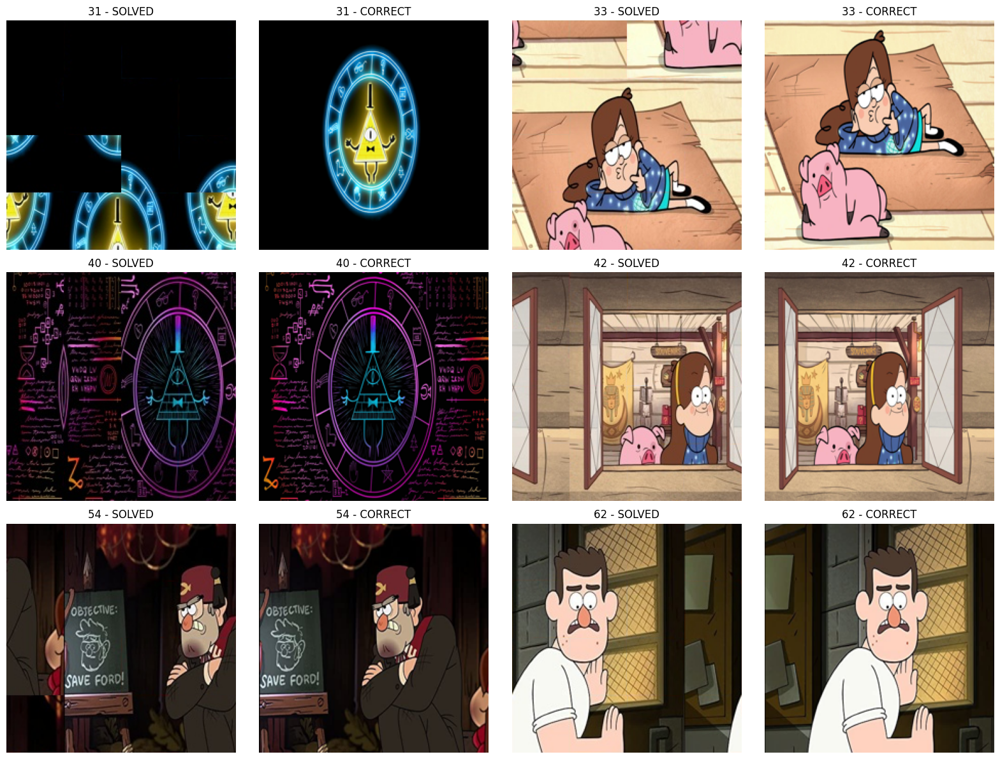

In [4]:
# Show incorrect solutions side-by-side with ground truth
incorrect = [r for r in results if not r['is_correct']]
print(f'Incorrect: {len(incorrect)}')

if incorrect:
    cols = 4
    rows = (len(incorrect) + 1) // 2
    fig, axes = plt.subplots(rows, cols, figsize=(16, 4*rows))
    if rows == 1:
        axes = axes.reshape(1, -1)
    
    for i, res in enumerate(incorrect):
        row = i // 2
        col = (i % 2) * 2
        
        axes[row, col].imshow(res['solved'])
        axes[row, col].set_title(f"{res['id']} - SOLVED")
        axes[row, col].axis('off')
        
        axes[row, col+1].imshow(res['correct'])
        axes[row, col+1].set_title(f"{res['id']} - CORRECT")
        axes[row, col+1].axis('off')
    
    for j in range(len(incorrect), rows * 2):
        row = j // 2
        col = (j % 2) * 2
        axes[row, col].axis('off')
        axes[row, col+1].axis('off')
    
    plt.tight_layout()
    plt.show()
else:
    print('All puzzles solved correctly!')

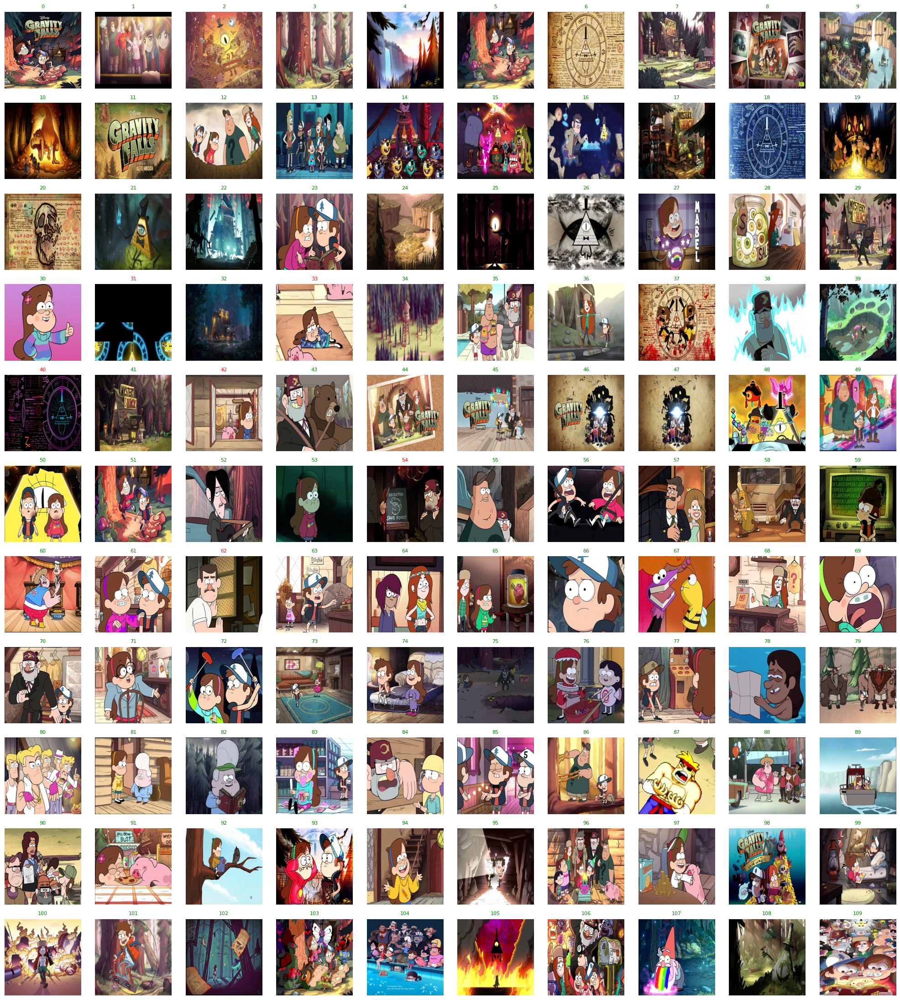

In [5]:
# Show all solved images in a grid
cols = 10
rows = (len(results) + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(20, 2*rows))
axes = axes.flatten()

for i, res in enumerate(results):
    axes[i].imshow(res['solved'])
    color = 'green' if res['is_correct'] else 'red'
    axes[i].set_title(res['id'], color=color, fontsize=8)
    axes[i].axis('off')

for j in range(len(results), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()